# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [ ]:
!pip install pyyaml==5.1
# This is the current pytorch version on Colab. Uncomment this if Colab changes its pytorch version
!pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 4.4 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=04f42cf816a58e867ff3eba724ec7ec242f702b16121dc853f431372421c5d14
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 831.4 MB 3.1 kB/s 
     |████████████████████████████████| 22.1 MB 39.7 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Suc

In [ ]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu102 True


# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the balloon segmentation dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)
which only has one class: balloon.
We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "balloon" category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset

Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

from detectron2.structures import BoxMode
from detectron2.data import MetadataCatalog, DatasetCatalog
def get_balloon_dicts(img_dir):
    classes = ['1']
    json_file = os.path.join(img_dir, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)
    print(json_file)
    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}
        
        filename = os.path.join(img_dir, v["filename"])
        print(filename)
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        annos = v["regions"]
        objs = []
        #print(annos)
        for anno in v["regions"]:
            # assert not anno["region_attributes"]
            # anno = anno["shape_attributes"]
            px = anno['shape_attributes']["all_points_x"]
            py = anno['shape_attributes']["all_points_y"]
            poly = [(x + 2, y + 2) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px)-10, np.min(py)-10, np.max(px)+10, np.max(py)+10],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": classes.index(anno['region_attributes']['name']),
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts


In [ ]:
#DatasetCatalog.list()

In [ ]:
for i in MetadataCatalog.list():
  if 'refine_data' in i:
    MetadataCatalog.remove(i)
#MetadataCatalog.list()

In [ ]:
for i in DatasetCatalog.list():
  if 'refine_data' in i:
    DatasetCatalog.remove(i)
#DatasetCatalog.list()

In [ ]:
for d in ["train", "val"]:
    DatasetCatalog.register("refine_data1_" + d, lambda d=d: get_balloon_dicts("/content/drive/MyDrive/ODO/odo/" +d ))
    MetadataCatalog.get("refine_data1_" + d).set(thing_classes=["OD"])
balloon_metadata = MetadataCatalog.get("refine_data1_train")

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



/content/drive/MyDrive/ODO/odo/train/via_region_data.json
/content/drive/MyDrive/ODO/odo/train/IMG_2322.jpg
/content/drive/MyDrive/ODO/odo/train/MJ000363_23s.jpg
/content/drive/MyDrive/ODO/odo/train/KL001856_9s.jpg
/content/drive/MyDrive/ODO/odo/train/00006508-PHOTO-2020-12-29-22-17-11.jpg
/content/drive/MyDrive/ODO/odo/train/00006499-PHOTO-2020-12-29-21-58-07.jpg
/content/drive/MyDrive/ODO/odo/train/00006189-PHOTO-2020-12-29-10-37-19.jpg
/content/drive/MyDrive/ODO/odo/train/00005406-PHOTO-2020-12-27-17-24-15.jpg
/content/drive/MyDrive/ODO/odo/train/00005785-PHOTO-2020-12-28-10-05-19.jpg
/content/drive/MyDrive/ODO/odo/train/00004613-PHOTO-2020-12-25-20-42-40.jpg
/content/drive/MyDrive/ODO/odo/train/00005353-PHOTO-2020-12-27-09-49-33.jpg
/content/drive/MyDrive/ODO/odo/train/00004815-PHOTO-2020-12-26-09-56-16.jpg
/content/drive/MyDrive/ODO/odo/train/00004612-PHOTO-2020-12-25-20-42-35.jpg
/content/drive/MyDrive/ODO/odo/train/00005052-PHOTO-2020-12-26-19-43-18.jpg
/content/drive/MyDrive/OD

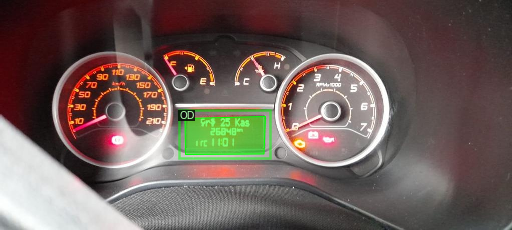

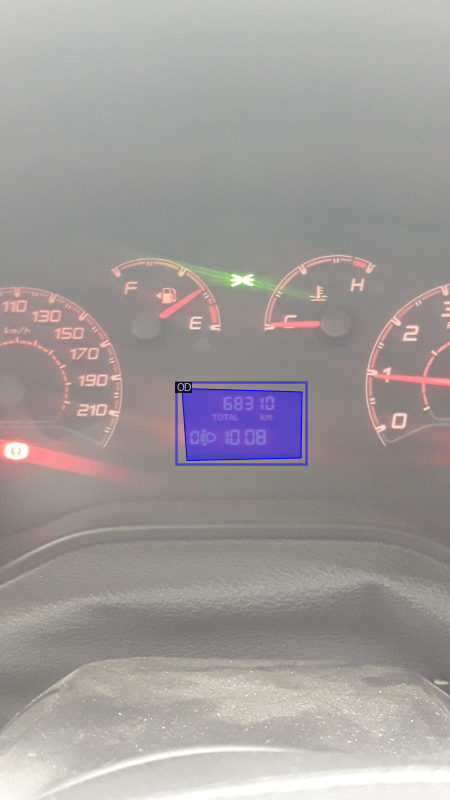

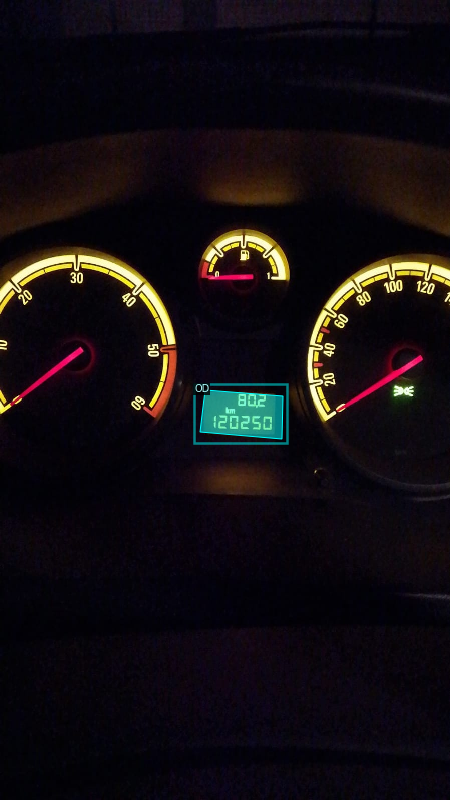

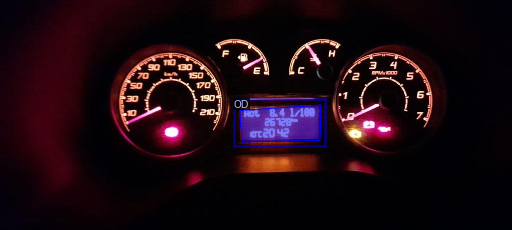

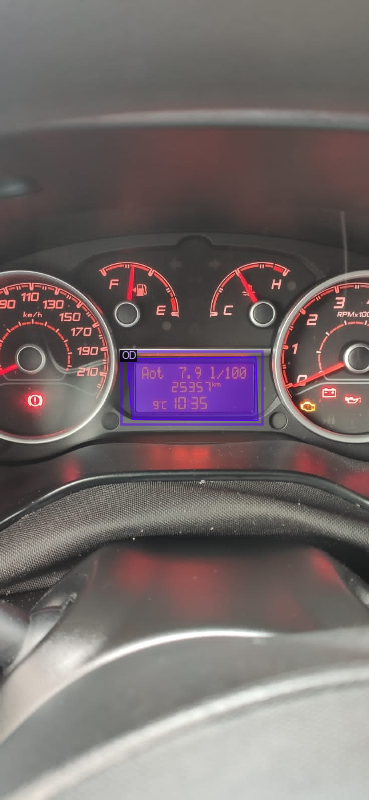

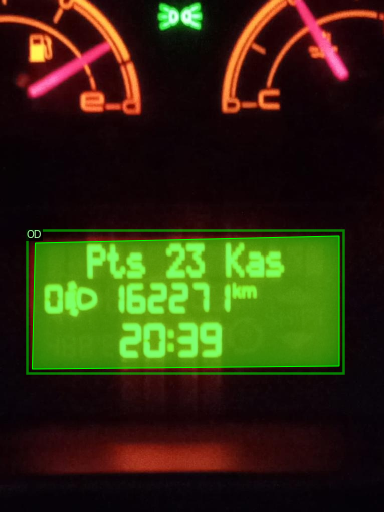

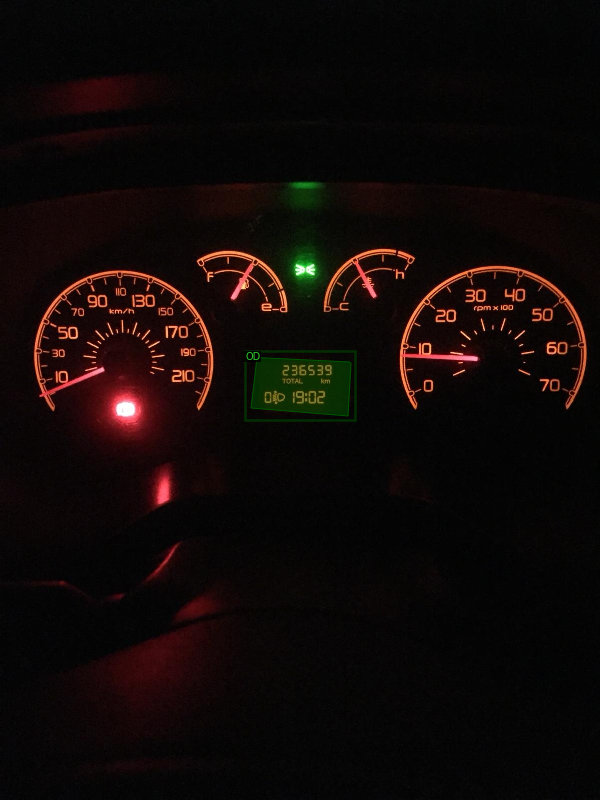

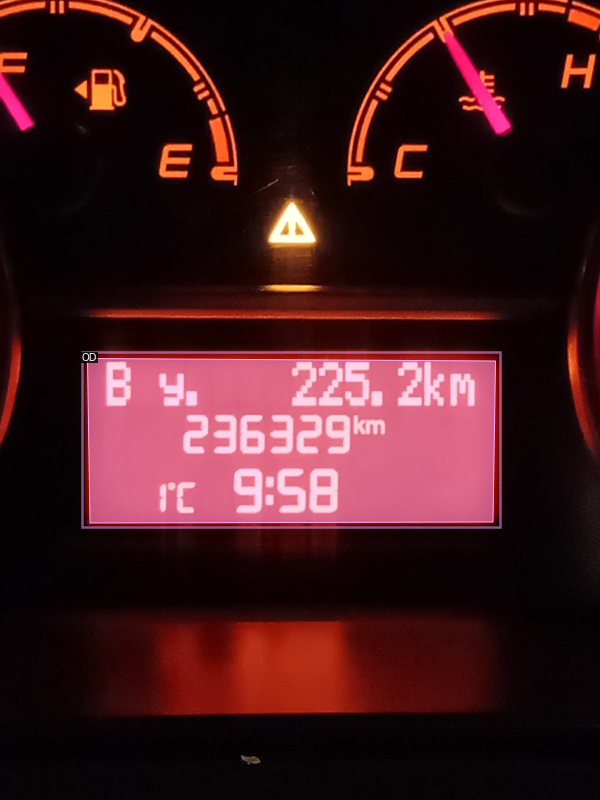

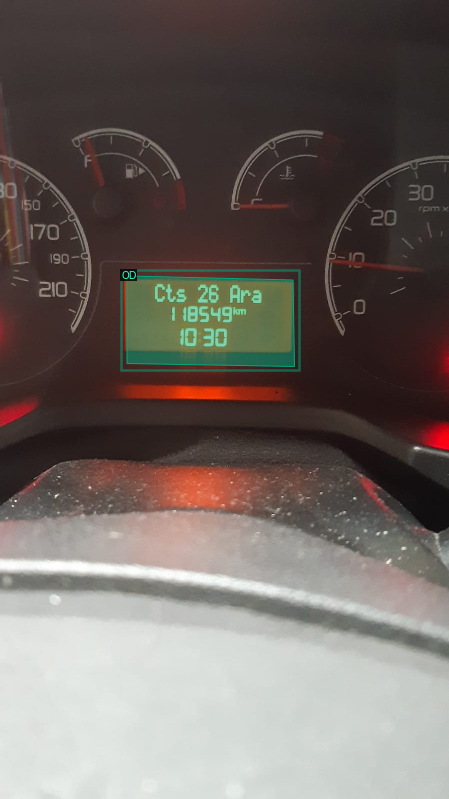

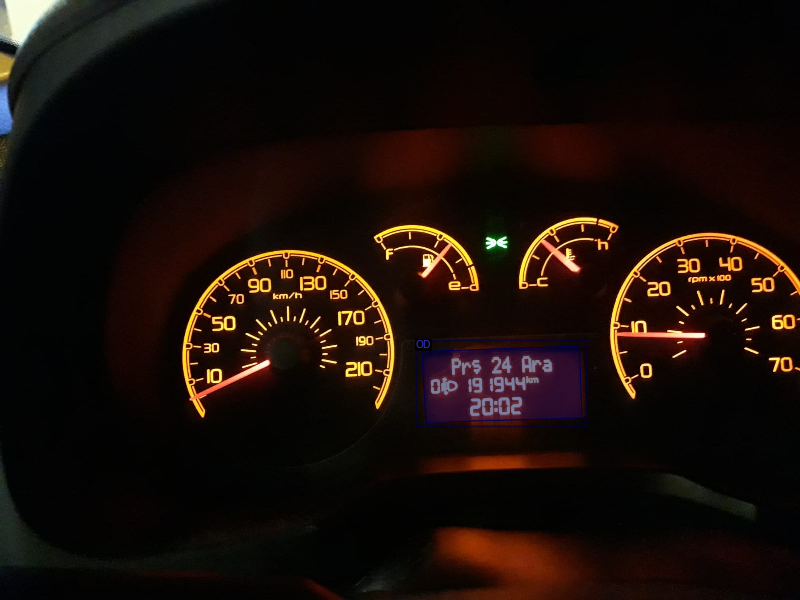

In [ ]:
dataset_dicts = get_balloon_dicts("/content/drive/MyDrive/ODO/odo/train")
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [ ]:
#os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [ ]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES=True

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("refine_data1_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/28 06:43:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:19, 9.07MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[12/28 06:43:57 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


[12/28 06:44:26 d2.utils.events]:  eta: 0:35:54  iter: 19  total_loss: 2.138  loss_cls: 0.9996  loss_box_reg: 0.4323  loss_mask: 0.6964  loss_rpn_cls: 0.006365  loss_rpn_loc: 0.006836  time: 1.4242  data_time: 0.0252  lr: 4.9953e-06  max_mem: 2673M
[12/28 06:44:54 d2.utils.events]:  eta: 0:35:15  iter: 39  total_loss: 1.962  loss_cls: 0.8857  loss_box_reg: 0.3991  loss_mask: 0.6717  loss_rpn_cls: 0.0172  loss_rpn_loc: 0.005883  time: 1.4214  data_time: 0.0093  lr: 9.9902e-06  max_mem: 2757M
[12/28 06:45:22 d2.utils.events]:  eta: 0:34:35  iter: 59  total_loss: 1.76  loss_cls: 0.7137  loss_box_reg: 0.3814  loss_mask: 0.6261  loss_rpn_cls: 0.0142  loss_rpn_loc: 0.005958  time: 1.4156  data_time: 0.0109  lr: 1.4985e-05  max_mem: 2757M
[12/28 06:45:52 d2.utils.events]:  eta: 0:34:23  iter: 79  total_loss: 1.554  loss_cls: 0.5624  loss_box_reg: 0.4217  loss_mask: 0.5696  loss_rpn_cls: 0.0129  loss_rpn_loc: 0.004069  time: 1.4312  data_time: 0.0098  lr: 1.998e-05  max_mem: 2757M
[12/28 06:46

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.80   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

In [ ]:
from detectron2.utils.visualizer import ColorMode

In [ ]:
from matplotlib import pyplot as plt

In [ ]:
def max_score_index(confidence_list):
  if confidence_list !=[]:
    confidence_score_list=confidence_list
    max_confidence_score = max(confidence_score_list)
    max_confidence_index = confidence_score_list.index(max_confidence_score)
    return max_confidence_index
  else:
    max_confidence_index=None
  return max_confidence_index

In [ ]:

#original_img_path = '/content/drive/MyDrive/number_plate/test/002.JPG'
def predict(original_img_path):
  im = cv2.imread(original_img_path)
  # print(im.shape)
  outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
  v = Visualizer(im[:, :, ::-1],
                  metadata=None, 
                  scale=0.5, 
                  instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels. This option is only available for segmentation models
  )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

  score_list=outputs["instances"].scores.tolist()
  # print(score_list)
  max_confidence_index = max_score_index(score_list)
  # print(max_confidence_index)
  List_Num_Classes=outputs['instances'].pred_classes

  list_class=List_Num_Classes.tolist()

  List_Boxes=outputs['instances'].pred_boxes

  list_co=List_Boxes.tensor.tolist()
  #cv2_imshow(out.get_image()[:, :, ::-1])
  class_list=get_class_list(out)
  # print("Number of Scratches:",class_list[0])
  # print("Number of Dents:",class_list[1])
  # print((outputs["instances"]))

  #max_confidence_co=[list_co[max_confidence_index]]
  if max_confidence_index==None:
    croppedImgPathList=[original_img_path]
  else:
    max_confidence_co=[list_co[max_confidence_index]]
    croppedImgPathList = crop(max_confidence_co, list_class, original_img_path)
    # print("final Json : ", createJsonresponse(original_img_path,croppedImgPathList,list_class))
    Final_json=createJsonresponse(original_img_path,croppedImgPathList,list_class)
    with open("sample.json", "w") as outfile:
      outfile.write(str(Final_json))
  return croppedImgPathList


In [ ]:
croppedImgPathList[0]

NameError: ignored

Number of Scratches: 0
Number of Dents: 1
Instances(num_instances=1, image_height=600, image_width=800, fields=[pred_boxes: Boxes(tensor([[344.1517, 233.3440, 479.2999, 312.4327]], device='cuda:0')), scores: tensor([0.9949], device='cuda:0'), pred_classes: tensor([0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]], device='cuda:0')])
final Json :  {'originalImg': '/content/drive/MyDrive/ODO/odometer_dec1/ABA00068_12s.jpg', 'crpDetails': [{'imagePath': '/content/Untitled Folder2021/12/28/ABA00068_12s_12_28_2021_07_25_23/1. Dent.jpg', 'dmgType': 0}]}


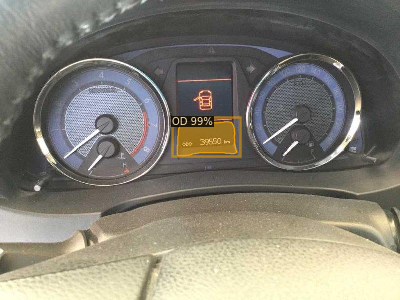

In [ ]:
original_img_path = '/content/drive/MyDrive/ODO/odometer_dec1/ABA00068_12s.jpg'
im = cv2.imread(original_img_path)
# print(im.shape)
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                metadata=balloon_metadata, 
                scale=0.5, 
                instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
List_Num_Classes=outputs['instances'].pred_classes
list_class=List_Num_Classes.tolist()
List_Boxes=outputs['instances'].pred_boxes
list_co=List_Boxes.tensor.tolist()
croppedImgPathList = crop(list_co, list_class, original_img_path)
class_list=get_class_list(out)
print("Number of Scratches:",class_list[0])
print("Number of Dents:",class_list[1])
print(outputs["instances"])
print("final Json : ", createJsonresponse(original_img_path,croppedImgPathList,list_class))
Final_json=createJsonresponse(original_img_path,croppedImgPathList,list_class)
with open("sample.json", "w") as outfile:
     outfile.write(str(Final_json))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
import matplotlib.pyplot as plt
p=croppedImgPathList[0]
p=plt.imread(p)
plt.imshow(p) 

In [ ]:
def processed_data(data_list):
  chassis_number:"NA"
  dict_chassis={}
  if data_list:      #checking for empty list
   chassis_number=max(data_list, key=len)     #select the string which hava maximum length
   chassis_number=chassis_number.replace(" ", "")    #removing spaces
   chassis_number=list(chassis_number)    #change string into list
   for i in range(len(chassis_number)):
     if str(chassis_number[i]).upper()=="O":    #replacing all "O" with zero
       chassis_number[i]=0                    
  chassis_number = ''.join([str(elem).upper() for elem in chassis_number])    #Join the list of character to make a string
  dict_chassis={"chassis_number": chassis_number}  # insert chassis number in to dictionary
  return   dict_chassis

In [ ]:
def createDateWiseFoldersIfNotExist(path):
    import os
    from datetime import datetime
    current_date = datetime.now()    
    if not os.path.exists(path+str(current_date.year)):
        os.mkdir(path+str(current_date.year))
        #path1=os.path.join(path+str(current_date.year))
    if not os.path.exists(path+str(current_date.year)+'/'+str(current_date.month)):
        os.mkdir(path+str(current_date.year)+'/'+str(current_date.month))
        #path1=os.path.join(path+str(current_date.year)+'/'+str(current_date.month))
    if not os.path.exists(path+str(current_date.year)+'/'+str(current_date.month)+'/'+str(current_date.day)):
        os.mkdir(path+str(current_date.year)+'/'+str(current_date.month)+'/'+str(current_date.day) )
        
        #path1=os.path.join(path+str(current_date.year)+'/'+str(current_date.month)+'/'+str(current_date.day))
    # now = datetime.now()
    # current_date = now.strftime("%m/%d/%Y, %H:%M:%S")

    path1 = os.path.join(path+str(current_date.year)+'/'+str(current_date.month)+'/'+str(current_date.day))
    
    return path1

In [ ]:
def createImgFolder(original_img_path):
  from datetime import datetime
  now = datetime.now()
  return original_img_path.split('/')[-1].split('.')[-2]+'_'+now.strftime('%m_%d_%Y_%H_%M_%S')


In [ ]:
def crop(list_co, list_class, original_img_path):
  '''
  list_co=list of coordinate of all images
  list_class=list of class
  img=image (in np.array)
  '''
  img = cv2.imread(original_img_path)
  
  # setting values to rows and column variables
  # rows = 7
  # columns = 3
  num=0
  path=createDateWiseFoldersIfNotExist('/content/Untitled Folder')
  #print(path)
  Img_folder_path= path+'/'+str( createImgFolder(original_img_path))
  if not os.path.exists(Img_folder_path):
    os.mkdir(Img_folder_path)
  
  pathFolder =os.path.join(Img_folder_path) 
  #print(pathFolder)
  crpImgPathList=[]
  for i in range(len(list_co)):
    num+=1
    #separate (x1, y1) and (x2, y2) in two differnt list
    c1=[list_co[i][0], list_co[i][1]]
    c2=[list_co[i][2], list_co[i][3]]
    #slicing image array
    if c1[1]>c2[1] and c1[0]>c2[0]:
      cropped_image = img[int(c2[1]):int(c1[1]), int(c2[0]):int(c1[0])]
    elif c1[0]<c2[0] and c1[1]<c2[1]:
      cropped_image = img[int(c1[1]):int(c2[1]), int(c1[0]):int(c2[0])]

    # putting the title
    if list_class[i]==1:
      title=str(num)+". Scratch"
    else:
      title=str(num)+". Dent"
    
    cv2.imwrite(pathFolder+'/'+str(title)+'.jpg',cropped_image)
    crpImgPathList.append(pathFolder+'/'+str(title)+'.jpg')
  return crpImgPathList

    

In [ ]:
def get_class_list(out):

    List_Num_Classes=outputs['instances'].pred_classes
    dent=0
    scratch=0
    for i in (List_Num_Classes.tolist()):
      #print(i)
      if i==1:
        dent=dent+1
      else:
        scratch = scratch+1  
    # print(dent)
    # print(scratch)
    return dent,scratch

In [ ]:
{'originalImg' : 'path' ,"crpDetails":[
{
     "imgPath":"something.jpg",
     "dmgType":"Dent"
}
]}

{'crpDetails': [{'dmgType': 'Dent', 'imgPath': 'something.jpg'}],
 'originalImg': 'path'}

In [ ]:
def createJsonresponse(originalImgPath ,croppedImgPaths,classList ):
  responseDict={}
  responseDict['originalImg']=originalImgPath
  responseDict['crpDetails'] = []
  # responseDict['']
  for i in range(len(croppedImgPaths)):
    internalList ={}
    internalList['imagePath']=croppedImgPaths[i]
    internalList['dmgType'] = classList[i]
    responseDict['crpDetails'].append(internalList)
  return responseDict

/content/drive/MyDrive/ODO/odo/val/via_region_data.json
/content/drive/MyDrive/ODO/odo/val/00000170-PHOTO-2020-12-20-18-47-24.jpg
/content/drive/MyDrive/ODO/odo/val/00001211-PHOTO-2020-12-10-11-47-26.jpg
/content/drive/MyDrive/ODO/odo/val/00000055-PHOTO-2020-11-21-10-15-21.jpg
/content/drive/MyDrive/ODO/odo/val/00000126-PHOTO-2020-12-18-21-17-15.jpg
/content/drive/MyDrive/ODO/odo/val/00000117-PHOTO-2020-11-22-10-57-28.jpg
/content/drive/MyDrive/ODO/odo/val/00000154-PHOTO-2020-12-19-18-27-43.jpg
/content/drive/MyDrive/ODO/odo/val/00000030-PHOTO-2020-11-20-20-21-52.jpg
/content/drive/MyDrive/ODO/odo/val/00000140-PHOTO-2020-12-19-17-33-53.jpg
/content/drive/MyDrive/ODO/odo/val/00000053-PHOTO-2020-11-21-09-54-07.jpg
/content/drive/MyDrive/ODO/odo/val/00001224-PHOTO-2020-12-10-11-47-26.jpg
/content/drive/MyDrive/ODO/odo/val/00000148-PHOTO-2020-12-19-17-40-59.jpg
/content/drive/MyDrive/ODO/odo/val/00000112-PHOTO-2020-11-22-00-14-07.jpg
/content/drive/MyDrive/ODO/odo/val/00000146-PHOTO-2020-1

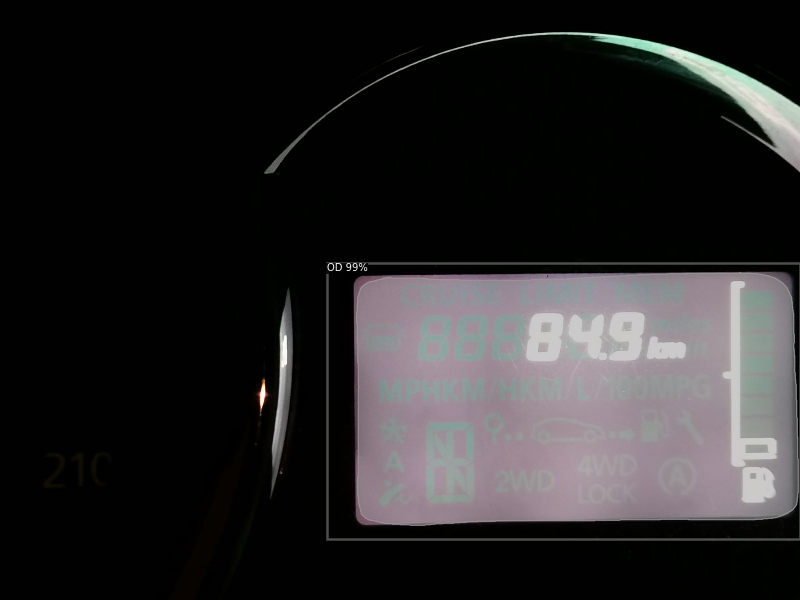

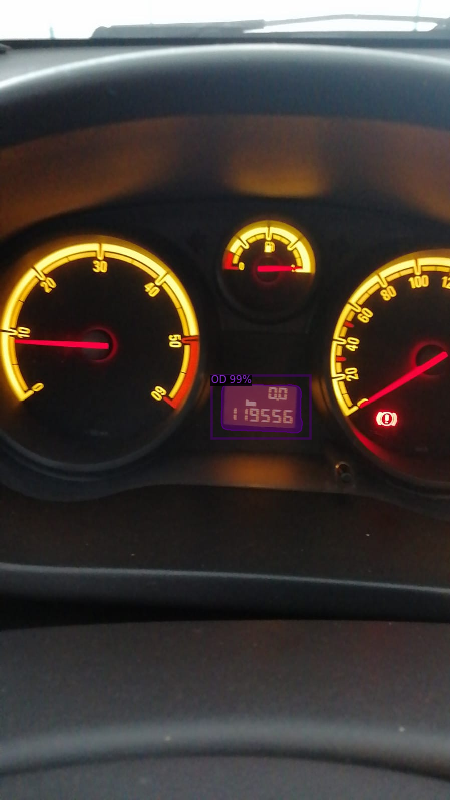

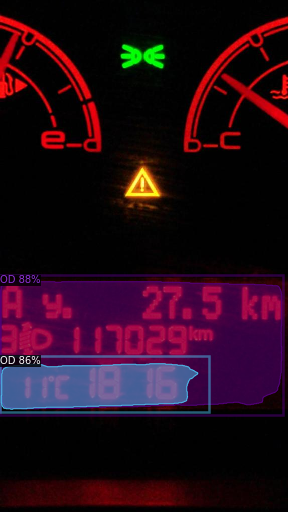

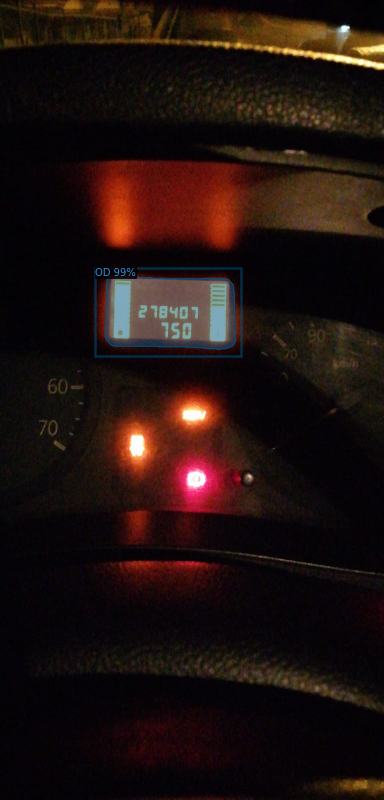

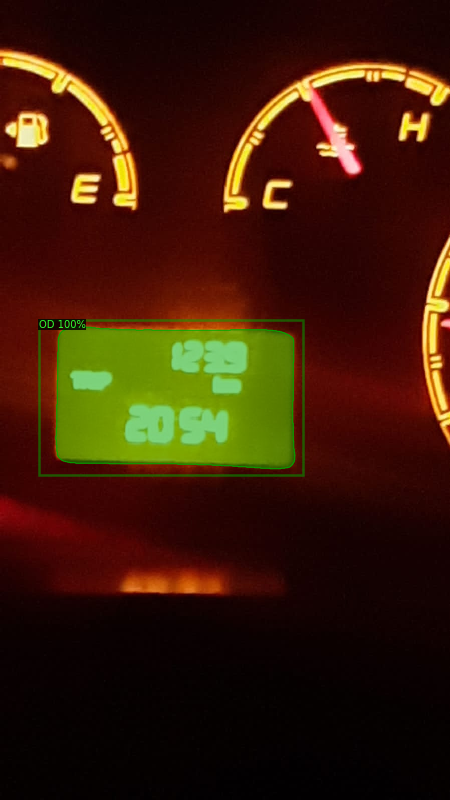

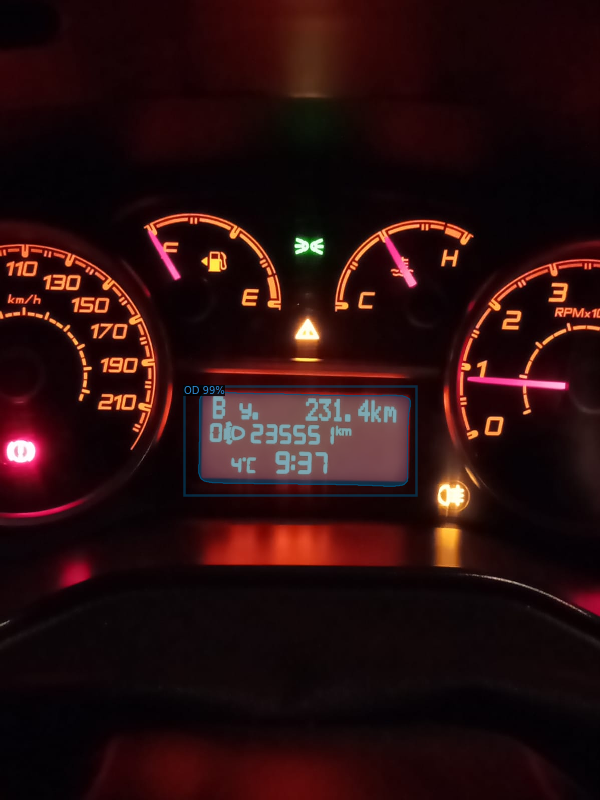

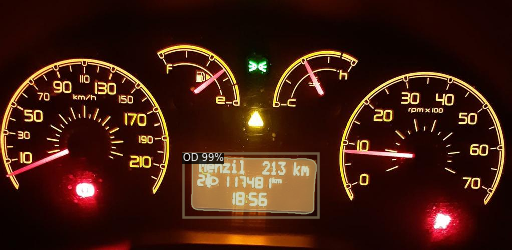

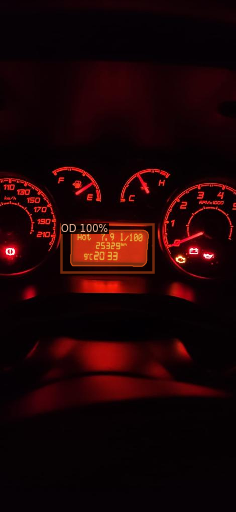

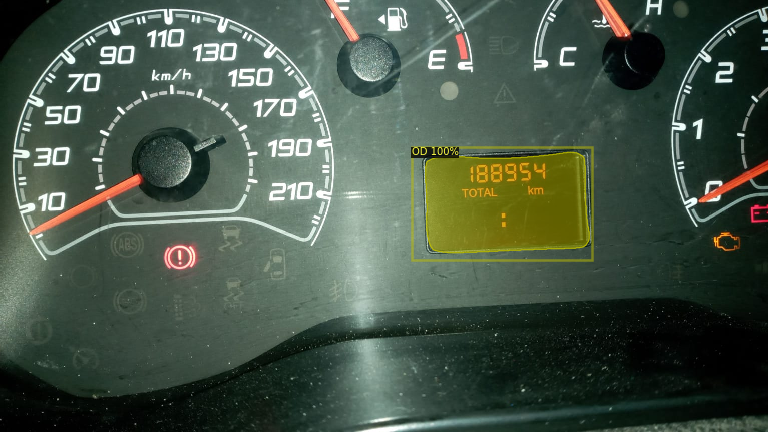

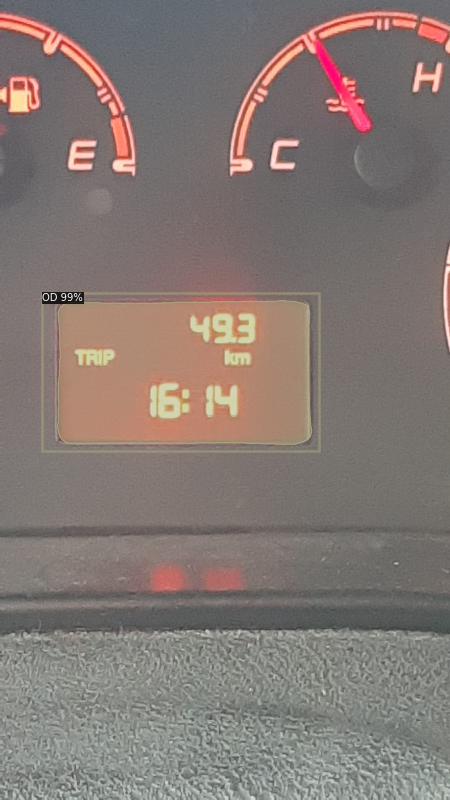

In [ ]:

dataset_dicts = get_balloon_dicts("/content/drive/MyDrive/ODO/odo/val")
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=balloon_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE  # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("refine_data1_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "refine_data1_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[12/28 06:18:08 d2.evaluation.coco_evaluation]: Trying to convert 'refine_data1_val' to COCO format ...
[12/28 06:18:08 d2.data.datasets.coco]: Converting annotations of dataset 'refine_data1_val' to COCO format ...)
/content/drive/MyDrive/ODO/odo/val/via_region_data.json
/content/drive/MyDrive/ODO/odo/val/00000170-PHOTO-2020-12-20-18-47-24.jpg
/content/drive/MyDrive/ODO/odo/val/00001211-PHOTO-2020-12-10-11-47-26.jpg
/content/drive/MyDrive/ODO/odo/val/00000055-PHOTO-2020-11-21-10-15-21.jpg
/content/drive/MyDrive/ODO/odo/val/00000126-PHOTO-2020-12-18-21-17-15.jpg
/content/drive/MyDrive/ODO/odo/val/00000117-PHOTO-2020-11-22-10-57-28.jpg
/content/drive/MyDrive/ODO/odo/val/00000154-PHOTO-2020-12-19-18-27-43.jpg
/content/drive/MyDrive/ODO/odo/val/00000030-PHOTO-2020-11-20-20-21-52.jpg
/content/drive/MyDrive/ODO/odo/val/00000140-PHOTO-2020-12-19-17-33-53.jpg
/content/drive/MyDrive/ODO/odo/val/00000053-PHOTO-2020-11-21-09-54-07.jpg
/content/drive/MyDrive/ODO/odo/val/00001224-PHOTO-2020-12-10-

# Other types of builtin models

We showcase simple demos of other types of models below:

model_final_a6e10b.pkl: 237MB [00:03, 75.7MB/s]                           


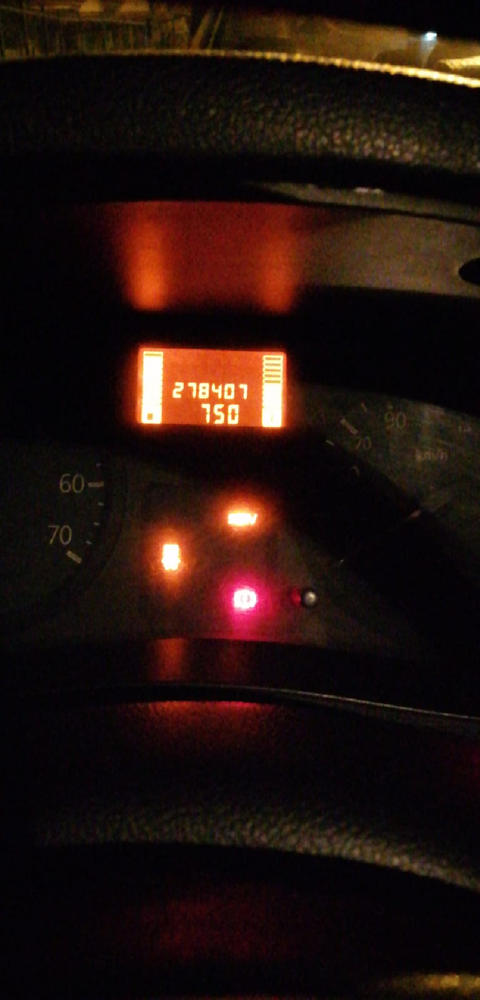

In [ ]:
# Inference with a keypoint detection model
cfg = get_cfg()   # get a fresh new config
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(out.get_image()[:, :, ::-1])

# Run panoptic segmentation on a video

In [ ]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("ll8TgCZ0plk", width=500)
display(video)

In [ ]:
# Install dependencies, download the video, and crop 5 seconds for processing
!pip install youtube-dl
!youtube-dl https://www.youtube.com/watch?v=ll8TgCZ0plk -f 22 -o video.mp4
!ffmpeg -i video.mp4 -t 00:00:06 -c:v copy video-clip.mp4

In [ ]:
# Run frame-by-frame inference demo on this video (takes 3-4 minutes) with the "demo.py" tool we provided in the repo.
!git clone https://github.com/facebookresearch/detectron2
# Note: this is currently BROKEN due to missing codec. See https://github.com/facebookresearch/detectron2/issues/2901 for workaround.
%run detectron2/demo/demo.py --config-file detectron2/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml --video-input video-clip.mp4 --confidence-threshold 0.6 --output video-output.mkv \
  --opts MODEL.WEIGHTS detectron2://COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl

In [ ]:
# Download the results
from google.colab import files
files.download('video-output.mkv')